In [8]:
import os
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from typing import List
np.set_printoptions(threshold=np.inf)  

from fragment import *
from side import *
from sides_comparison import *
from utils import *
from puzzle import *
import global_values
from displaying import *
from assembled_groups import *


In [9]:
image_path = "disney_puzzle/aladin.jpg" 
# image_path = "angry.jpg"
output_folder = "fragments"
global_values.COL_NR = 20
global_values.ROW_NR = 20
fragments, tile_h, tile_w = divide_image(image_path, output_folder, global_values.COL_NR, global_values.ROW_NR)
global_values.TILE_H = global_values.TILE_W = max(tile_h, tile_w)


100%|██████████| 399/399 [00:09<00:00, 43.40it/s] 


Side: fragment_idx=166, side_idx=1 and Side: fragment_idx=167, side_idx=3
Side: fragment_idx=87, side_idx=2 and Side: fragment_idx=107, side_idx=0
Side: fragment_idx=126, side_idx=1 and Side: fragment_idx=127, side_idx=3
Side: fragment_idx=238, side_idx=2 and Side: fragment_idx=258, side_idx=0
Side: fragment_idx=169, side_idx=1 and Side: fragment_idx=170, side_idx=3
Side: fragment_idx=260, side_idx=2 and Side: fragment_idx=280, side_idx=0
Side: fragment_idx=89, side_idx=1 and Side: fragment_idx=90, side_idx=3
Side: fragment_idx=92, side_idx=2 and Side: fragment_idx=112, side_idx=0
Side: fragment_idx=247, side_idx=1 and Side: fragment_idx=248, side_idx=3
Side: fragment_idx=68, side_idx=1 and Side: fragment_idx=69, side_idx=3
Side: fragment_idx=165, side_idx=1 and Side: fragment_idx=166, side_idx=3
Side: fragment_idx=270, side_idx=1 and Side: fragment_idx=271, side_idx=3
Side: fragment_idx=369, side_idx=1 and Side: fragment_idx=370, side_idx=3
Side: fragment_idx=149, side_idx=1 and Side:

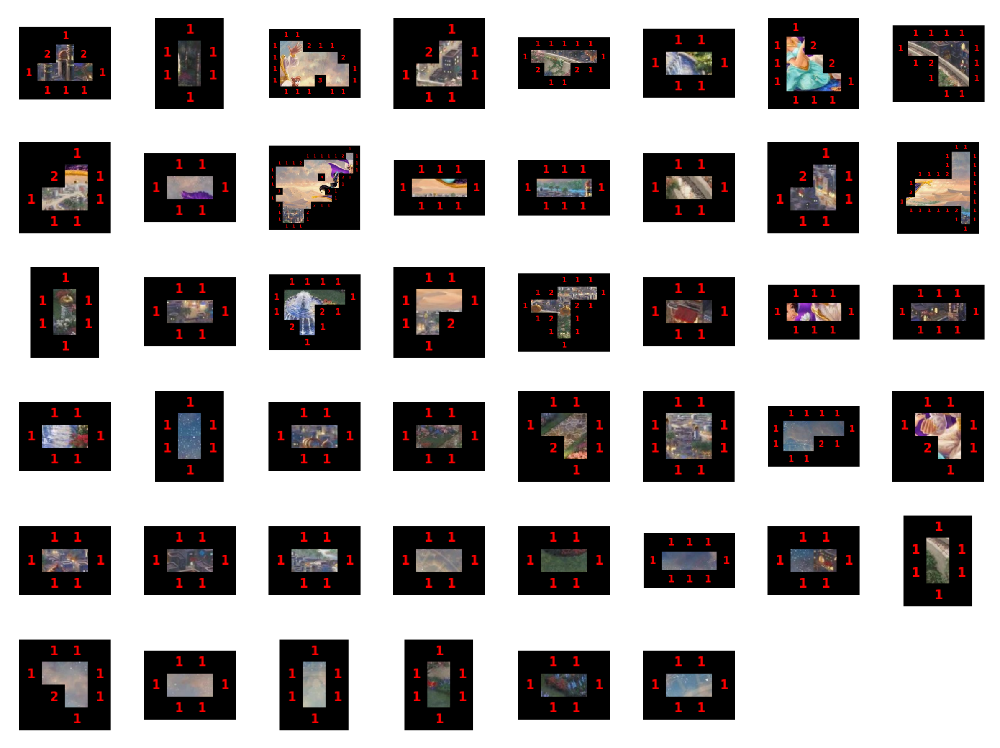

In [10]:

sides_comparisons = create_sides_comparisons(fragments)
sorted_sides_comparisons = sort_sides_comparisons(sides_comparisons)
for s in sorted_sides_comparisons:
    print(f"{s.side1} and {s.side2}")

groups = []
fragment_idx_to_group_idx = [None for fr in fragments]

for s in sorted_sides_comparisons:
    if s.score < 0.08:
        was_change = False

        if fragment_idx_to_group_idx[s.side1.fragment_idx] is not None and fragment_idx_to_group_idx[s.side2.fragment_idx] is not None:
            group_idx1 = fragment_idx_to_group_idx[s.side1.fragment_idx]
            group_idx2 = fragment_idx_to_group_idx[s.side2.fragment_idx]
            if group_idx1 == group_idx2:
                continue

            new_fragment_idx_to_group_idx, new_groups = merge_groups(s,fragments, fragment_idx_to_group_idx, groups, group_idx1, group_idx2)

            if new_fragment_idx_to_group_idx is not None and new_groups is not None:
                fragment_idx_to_group_idx = new_fragment_idx_to_group_idx
                groups = new_groups
                was_change = True

        else:

            if fragment_idx_to_group_idx[s.side1.fragment_idx] is None and fragment_idx_to_group_idx[s.side2.fragment_idx] is None:
                print("new group")
                if check_if_two_fragments_are_vertical(s):
                    new_group = assembledGroup(s)
                    groups.append(new_group)
                    fragment_idx_to_group_idx[s.side1.fragment_idx] = len(groups)-1
                    fragment_idx_to_group_idx[s.side2.fragment_idx] = len(groups)-1
                    was_change = True

            else:
                for group_idx, group in enumerate(groups):
                    if (
                        s.side1.fragment_idx in group.used_fragments and fragment_idx_to_group_idx[s.side2.fragment_idx] is None
                    ):
                        print(f"adding piece to existing group {group_idx}")
                        if group.add_fragment(fragments, s.side1, s.side2):
                            fragment_idx_to_group_idx[s.side2.fragment_idx] = group_idx
                            was_change = True
                    elif (
                        s.side2.fragment_idx in group.used_fragments and fragment_idx_to_group_idx[s.side1.fragment_idx] is None
                    ):
                        print(f"adding piece to existing group {group_idx}")
                        if group.add_fragment(fragments, s.side2, s.side1):
                            fragment_idx_to_group_idx[s.side1.fragment_idx] = group_idx
                            was_change = True
    
    # if was_change:
        # print("--------------------------------------------------------------------")
        # print(f"{s.side1} and {s.side2}\n\n")
    #     for group_idx, group in enumerate(groups):
    #         print(f"group fragments: {group.used_fragments}")
    #         print(f"group positions: {group.fragment_positions}")
    #         group.show(fragments)

groups_img = []
for group_idx, group in enumerate(groups):
    print(f"group {group_idx}")
    print(f"group fragments: {group.used_fragments}")
    print(f"group positions: {group.fragment_positions}")
    group.nr_of_neighbours_grid()
    gr_img = group.show_no_background(fragments, 1)
    groups_img.append(gr_img)

import matplotlib.pyplot as plt


def show_images(images, max_cols=8):
    n = len(images)
    n_cols = min(n, max_cols)
    n_rows = (n + max_cols - 1) // max_cols  
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 3))
    axes = axes.flatten()
    for i, ax in enumerate(axes):
        if i < n:
            ax.imshow(images[i])
        ax.axis('off')

    plt.tight_layout()
    plt.show()


show_images(groups_img)


In [11]:
#  masura de performanta
# greedy -> contrangeri
# piese rotite
# similaritate cu retea
